In [1]:
%load_ext autoreload
%autoreload 2
import sys
print(sys.executable)
import sklearn.preprocessing as pre, scipy, numpy as np, matplotlib.pyplot as plt, glob, pickle, pyemma as py, sys, os
import pandas as pd
import seaborn as sns 
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]= "2"
%matplotlib inline
from temp_tf_load import *
sys.path.append('../')
from hde import HDE, analysis
lag_time = 10
import warnings
warnings.filterwarnings('ignore')

print(tf.__version__)
print(py.__version__)



/home/mikejones/anaconda3/bin/python


/home/mikejones/anaconda3/lib/python3.7/site-packages/pyemma/__init__.py:92: UserWarning: You are not using the latest release of PyEMMA. Latest is 2.5.7, you have 2.5.6.
  .format(latest=latest, current=current), category=UserWarning)
Using TensorFlow backend.




1.14.0
2.5.6


In [2]:
tf.__version__

'1.14.0'

In [3]:
# load thermo and pairwise distance features seperately
# only pwd features are used to train the model, thermo are for plotting

#thermo_features = np.load('/home/mikejones/scratch-midway2/srv/dna_data/thermo-2831-1000-10.npy')
#pwd_features = np.load('/home/mikejones/scratch-midway2/srv/dna_data/pwdr-2831-1000-190.npy')[:1500]
pwd_features = np.load('/home/mikejones/scratch-midway2/srv/dna_data/mdtraj-pwdr-AT-all-T330-477-1000-190.npy')

scaler = pre.MinMaxScaler(feature_range=(-1, 1))

#scaler.fit(np.concatenate(thermo_features))
#thermo_features_s = [scaler.transform(item) for item in thermo_features]

scaler.fit(np.concatenate(pwd_features))
pwd_features_s = [scaler.transform(item) for item in pwd_features]

#print(np.shape(thermo_features))
print(np.shape(pwd_features))


(477, 1000, 190)


In [4]:
print(np.size(pwd_features))
print(np.size(np.concatenate(pwd_features)))

90630000
90630000


## HDE

In [5]:
skip = 1
from keras.callbacks import EarlyStopping
earlyStopping = EarlyStopping(monitor='val_loss', patience=30, verbose=1, mode='min', restore_best_weights=True)

n_sm = 8 

hde = HDE(190, n_components=n_sm, lag_time=lag_time // skip, dropout_rate=0, batch_size=50000, n_epochs=10, 
          validation_split=0.1, batch_normalization=True, learning_rate = 0.01,
          callbacks=[earlyStopping])


In [6]:
# hde.r_degree = 10    # pre-training, to speed up discovery of first few slowest modes
# hde.batch_size = 200000
# hde.n_epochs = 50
# hde.fit(pairwise_dis_s)
# hde._recompile = True
# hde.r_degree = 5
# hde.fit(pairwise_dis_s)
# hde.batch_size = 500000
# hde._recompile = True
# hde.r_degree = 2
# hde.n_epochs = 100
# hde.fit(pairwise_dis_s)

In [7]:
hde.r_degree = 2
hde.n_epochs = 100
hde.fit(np.concatenate(pwd_features))


Instructions for updating:
Use `tf.cast` instead.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Train on 429291 samples, validate on 47699 samples
Epoch 1/100
429291/429291 [==============================] - 7s 16us/step - loss: -6.0493 - val_loss: -7.1769
Epoch 2/100
429291/429291 [==============================] - 2s 5us/step - loss: -7.4074 - val_loss: -7.5687
Epoch 3/100
429291/429291 [==============================] - 2s 5us/step - loss: -7.6594 - val_loss: -7.7217
Epoch 4/100
429291/429291 [==============================] - 2s 4us/step - loss: -7.7882 - val_loss: -7.8272
Epoch 5/100
429291/429291 [==============================] - 2s 4us/step - loss: -7.8827 - val_loss: -7.9013
Epoch 6/100
429291/429291 [==============================] - 2s 5us/step - loss: -7.9504 - val_loss: -7.9591
Epoch 7/100
429291/429291 [==============================] - 2s 5us/step - loss: -8.0025 - val_loss: -8.0156
Epoch 8/100
429291/429291 [=============

429291/429291 [==============================] - 2s 4us/step - loss: -8.4634 - val_loss: -8.3578
Epoch 69/100
429291/429291 [==============================] - 2s 4us/step - loss: -8.4582 - val_loss: -8.3187
Epoch 70/100
429291/429291 [==============================] - 2s 5us/step - loss: -8.4591 - val_loss: -8.2982
Epoch 71/100
429291/429291 [==============================] - 2s 5us/step - loss: -8.4651 - val_loss: -8.3100
Epoch 72/100
429291/429291 [==============================] - 2s 4us/step - loss: -8.4661 - val_loss: -8.2563
Epoch 73/100
429291/429291 [==============================] - 2s 4us/step - loss: -8.4576 - val_loss: -8.0817
Epoch 74/100
429291/429291 [==============================] - 2s 4us/step - loss: -8.4578 - val_loss: -8.2928
Epoch 75/100
429291/429291 [==============================] - 2s 4us/step - loss: -8.4602 - val_loss: -8.3212
Epoch 76/100
429291/429291 [==============================] - 2s 4us/step - loss: -8.4719 - val_loss: -8.3603
Epoch 77/100
429291/429

HDE(activation=None, batch_normalization=True, batch_size=50000,
    callbacks=[<keras.callbacks.EarlyStopping object at 0x7fd4deb2b278>],
    dropout_rate=0, hidden_layer_depth=None, hidden_size=None, input_size=190,
    l2_regularization=0.0, lag_time=10, latent_space_noise=0,
    learning_rate=0.01, n_components=8, n_epochs=100, validation_split=0.1,
    verbose=True)

In [8]:
hde_coords = [hde.transform(item) for item in pwd_features]
hde_timescales = hde.timescales_
print(hde_timescales)

[360.71365536 339.56538918 329.21049465 312.09954797 296.97463404
 239.49023588 146.454122   121.48515229]


In [42]:
## make pandas data frame

skip = 500    #num coords to skip on plot
num_bp = 10

print (np.shape(hde_coords))
print (np.shape(pwd_features))

hde_coords_conc = np.concatenate(hde_coords)[::skip]
pwd_features_conc = np.concatenate(pwd_features)[::skip]

index_size = len(hde_coords_conc[:, 0])

print (np.shape(hde_coords_conc))
print (np.shape(pwd_features_conc))


hde_col_list = ['1st_EF', '2nd_EF', '3rd_EF', '4th_EF', '5th_EF', '6th_EF', '7th_EF', '8th_EF']
df = pd.DataFrame(data    = hde_coords_conc, 
                  columns = hde_col_list[:n_sm],
                  index   = np.linspace(1, index_size, index_size))

#dict shows which indices need to be averaged in order to form their corresponding features
bp_match_dict  =  {'inter_ends':[9, 90],
                   'inter_cores':[45, 54],
                   'inter_all':[(i+1)*9 for i in range (num_bp)],
                   'intra_ends':[136, 181],
                   'intra_end_to_core':[110, 140, 155, 185],
                   'cross_shift_up_2':[2 + i*11 for i in range (num_bp - 2)],
                   'cross_shift_down_2':[20 + i*11 for i in range (num_bp - 2)],
                   'shift_up_2':[29 + i*9 for i in range (num_bp - 2)],
                   'shift_down_2':[7 + i*9 for i in range (num_bp - 4)],
                   'shift_up_4':[49 + i*9 for i in range (num_bp - 2)],
                   'shift_down_4':[5 + i*9 for i in range (num_bp - 2)],
                   'cross_ends': [0, 99]}

#adds each mean calculation to the dataframe where the dict key becomes the col name
for key in bp_match_dict:
    mean_vec = np.mean(pwd_features_conc[:, bp_match_dict[key]], axis=1)
    df[key] = mean_vec

    
'''

df_thermo =  pd.DataFrame(data    = thermo_features_conc, 
                   columns = feature_col_list, 
                   index   = np.linspace(1, index_size, index_size))

df = df_hde.join(df_thermo)
df = df.join(df_bp)

'''

print(df.head())

(1500, 1000, 8)
(1500, 1000, 190)
(3000, 8)
(3000, 190)
       1st_EF    2nd_EF    3rd_EF    4th_EF    5th_EF    6th_EF    7th_EF  \
1.0 -1.210722  1.059629  2.351271 -0.042268  0.367406  1.404577 -1.221642   
2.0  0.170521  0.001424  1.024090 -0.136527  0.357438  1.446241  0.291046   
3.0 -0.414888 -0.150527 -1.364548  0.841686  8.260349 -1.869007  0.011328   
4.0 -0.460069  0.182766 -1.512365  0.187571  0.708213  1.187935 -0.016627   
5.0 -0.827652  0.122534  0.087901  0.325512 -0.526889 -1.539838  1.351373   

       8th_EF  inter_ends  inter_cores  inter_all  intra_ends  \
1.0  0.018365    0.085948     0.152174   0.107733    0.033590   
2.0 -0.451089    0.053342     0.044106   0.061599    0.030138   
3.0 -0.081583    0.060480     0.121776   0.095548    0.031976   
4.0  0.335827    0.042939     0.095212   0.075149    0.029880   
5.0  0.039969    0.137991     0.169470   0.158190    0.034084   

     intra_end_to_core  cross_shift_up_2  cross_shift_down_2  shift_up_2  \
1.0           

In [43]:

pkl_path = './dataframe_outputs/pwdr-chunked-AT-all-326K-1500x1000.pkl'
df.to_pickle(pkl_path)

#df = pd.read_pickle(pkl_path)

In [65]:
import matplotlib.pylab as plt
import matplotlib.gridspec as gridspec

# makes a collection of subplots comparing
def plot_subs(df, plot_list, EF):
    
    # sets font params and dimensions of subplots
    plt.rcParams.update({'font.size': 32})
    dim = len(plot_list)
    
    tPlot, axes = plt.subplots(
            nrows=dim, ncols=dim, sharex=True, sharey=False, figsize=[40, 40],
            gridspec_kw={'wspace':0.2, 'hspace': 0.2}
            )

    axes_labels = [0 for i in range(dim**2)]
    
    # interates through plot_dict twice and coordinate and plot each coord against the others
    for j, k_i in enumerate(plot_list):
        for i, k_j in enumerate(plot_list):
            
            x = df[k_i]
            y = df[k_j]
            axes_labels[i*dim+j] = [k_i, k_j]
            color = df[EF]
            
            axes[i][j].scatter(x, y, c=color, cmap='magma')

    # sets axes such that labels are only on the left and bottom
    for i, ax in enumerate(axes.flat):
        ax.set(xlabel=axes_labels[i][0], ylabel=axes_labels[i][1])
        ax.label_outer()
            
    plt.show()
    

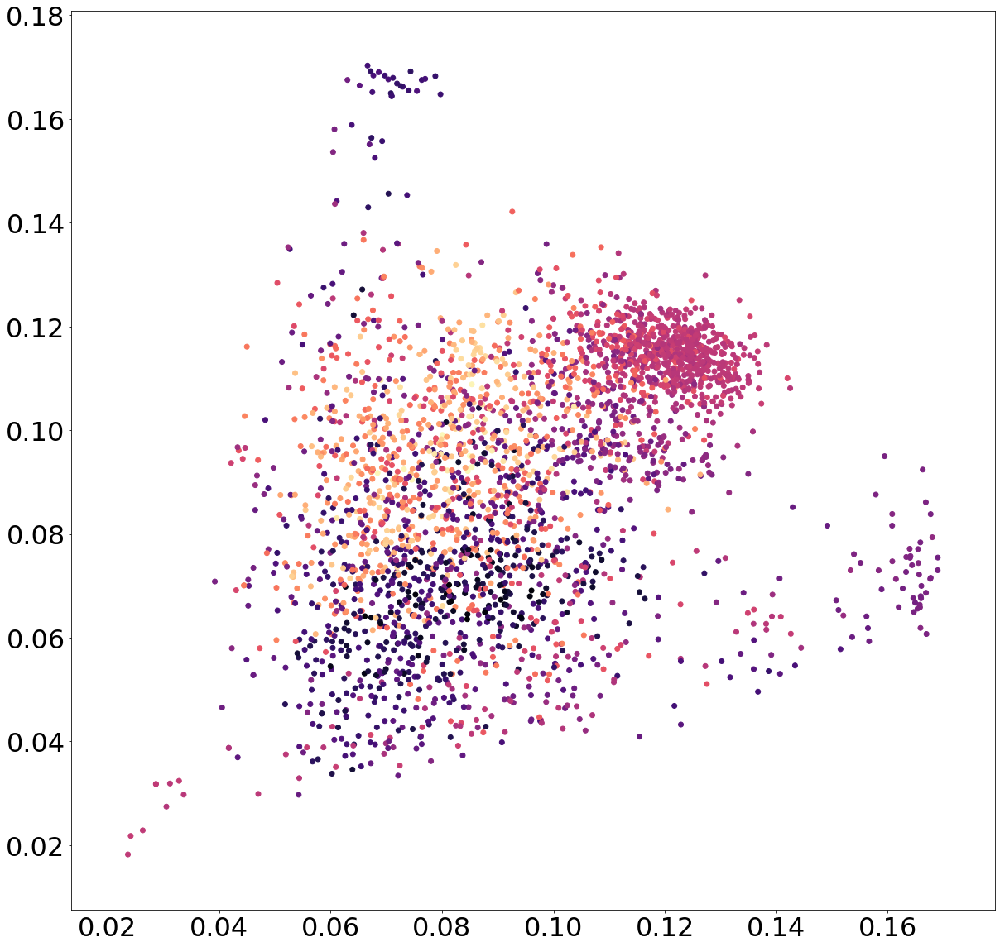

3000


In [70]:


EF = "3rd_EF"

plt.rcParams.update({'font.size': 32})
plt.figure(figsize=(20,20))

x = df['shift_up_2']
y = df['shift_down_2']

#x = df['2nd_EF']
#x = np.divide(df['inter_ends'], df['inter_cores'])
#y = df['inter_all']

color = df[EF]

plt.scatter(x, y, c=color, cmap='magma')


plt.show()

## find index of certain points in a given eigenvector

EF_arr = df['5th_EF']
print (len(EF_arr))

for i , val in enumerate(EF_arr):
    
    if val > 35:
        print (i)
        

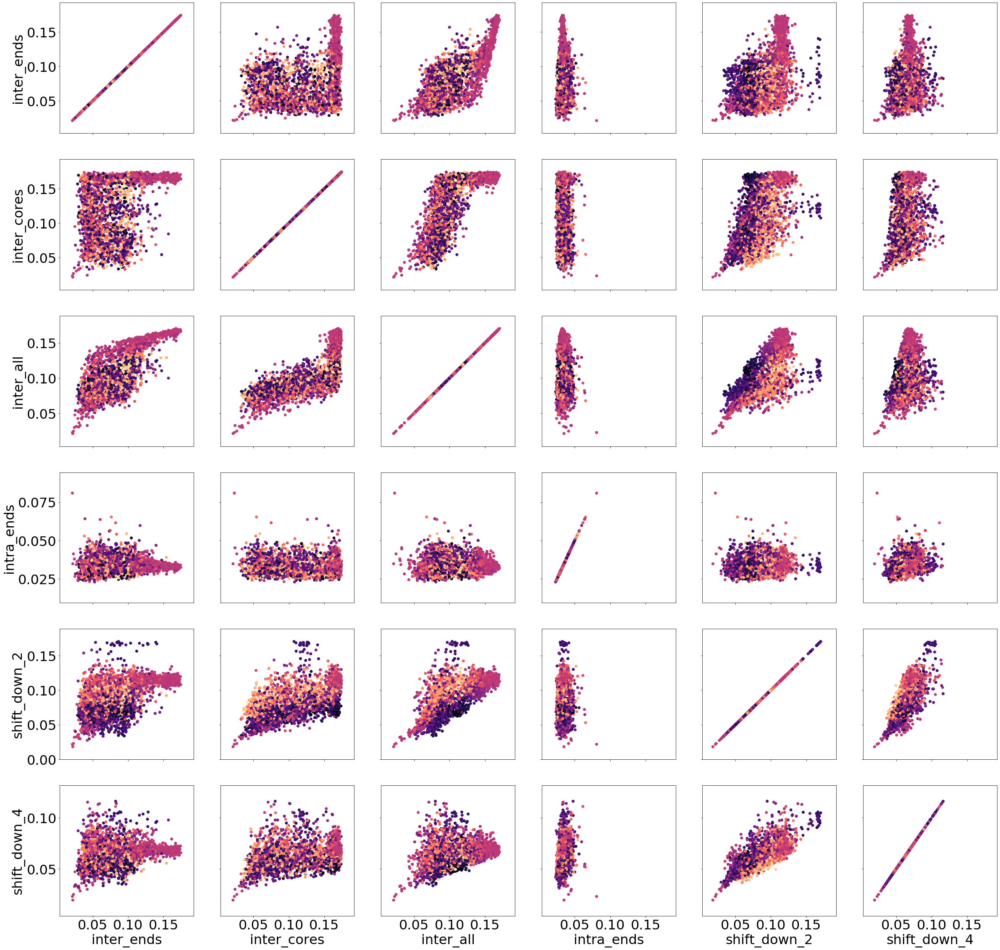

In [69]:
plot_list = ('inter_ends', 'inter_cores', 'inter_all', 'intra_ends', 'shift_down_2', 'shift_down_4')

plot_subs(df, plot_list, '3rd_EF')

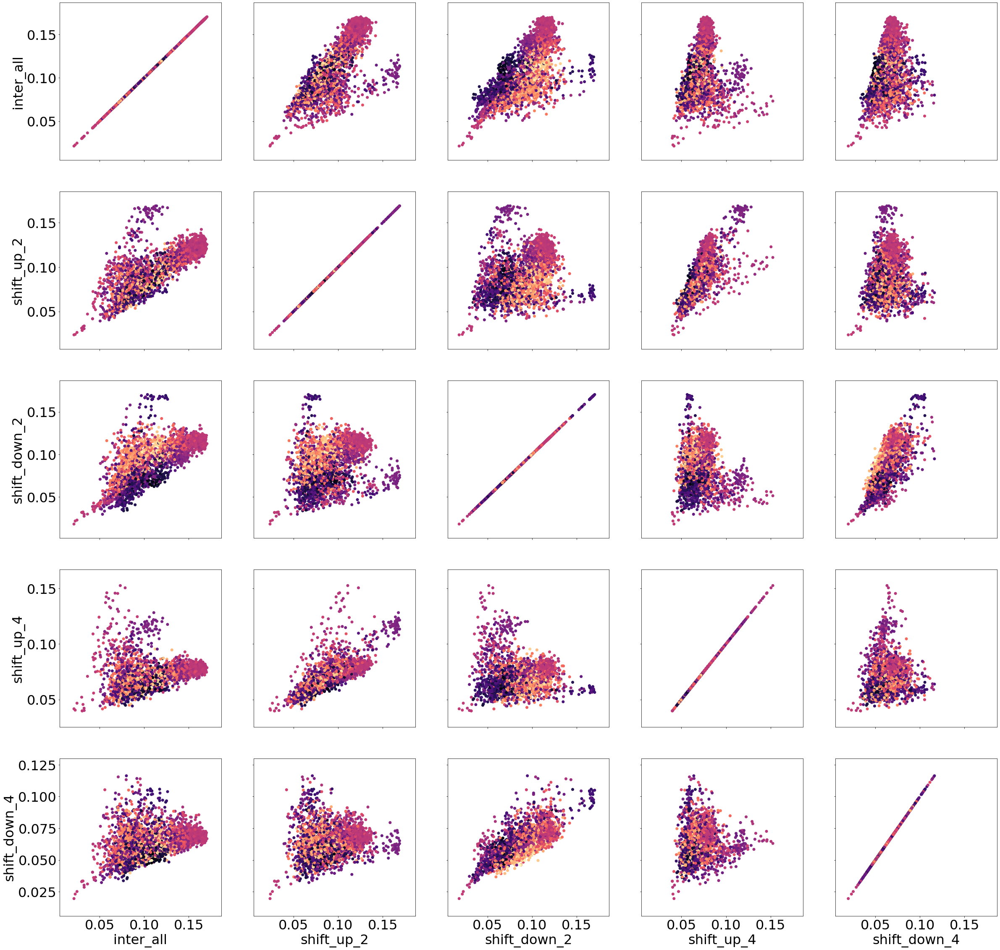

In [60]:
plot_subs(df, bp_match_dict, '3rd_EF')

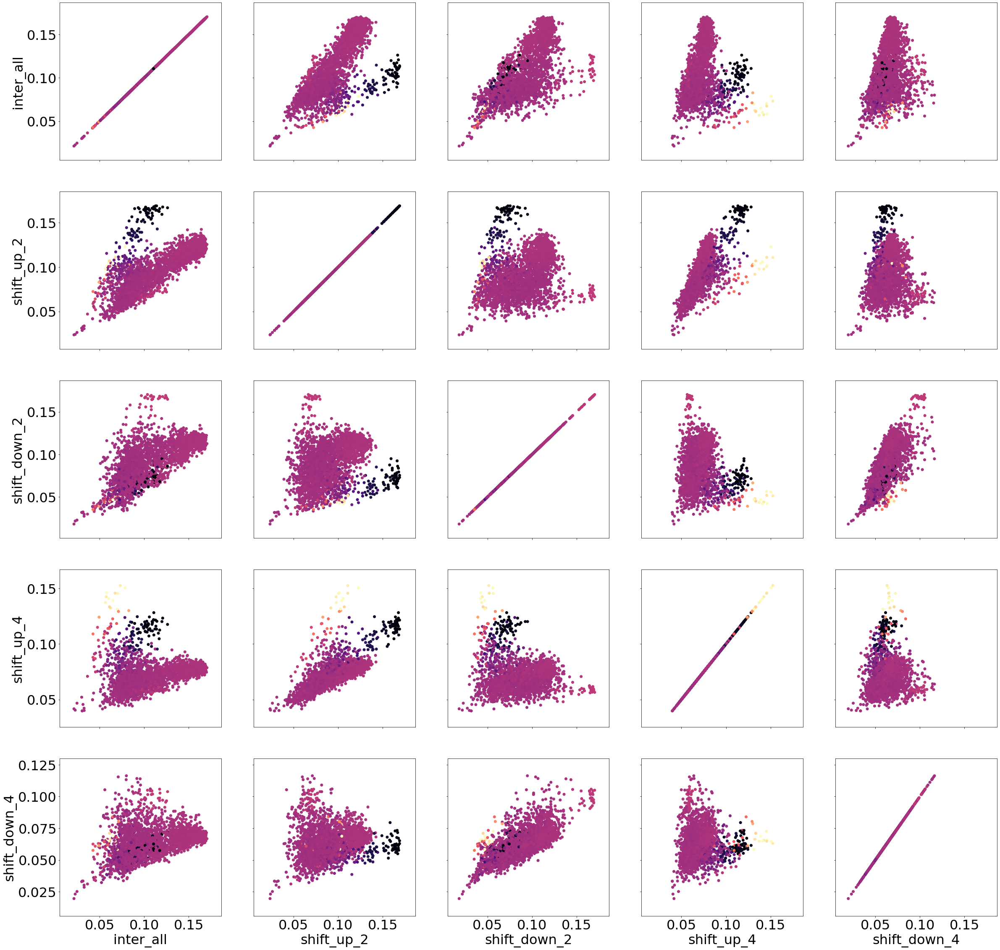

In [53]:
plot_subs(df, bp_match_dict, '4th_EF')

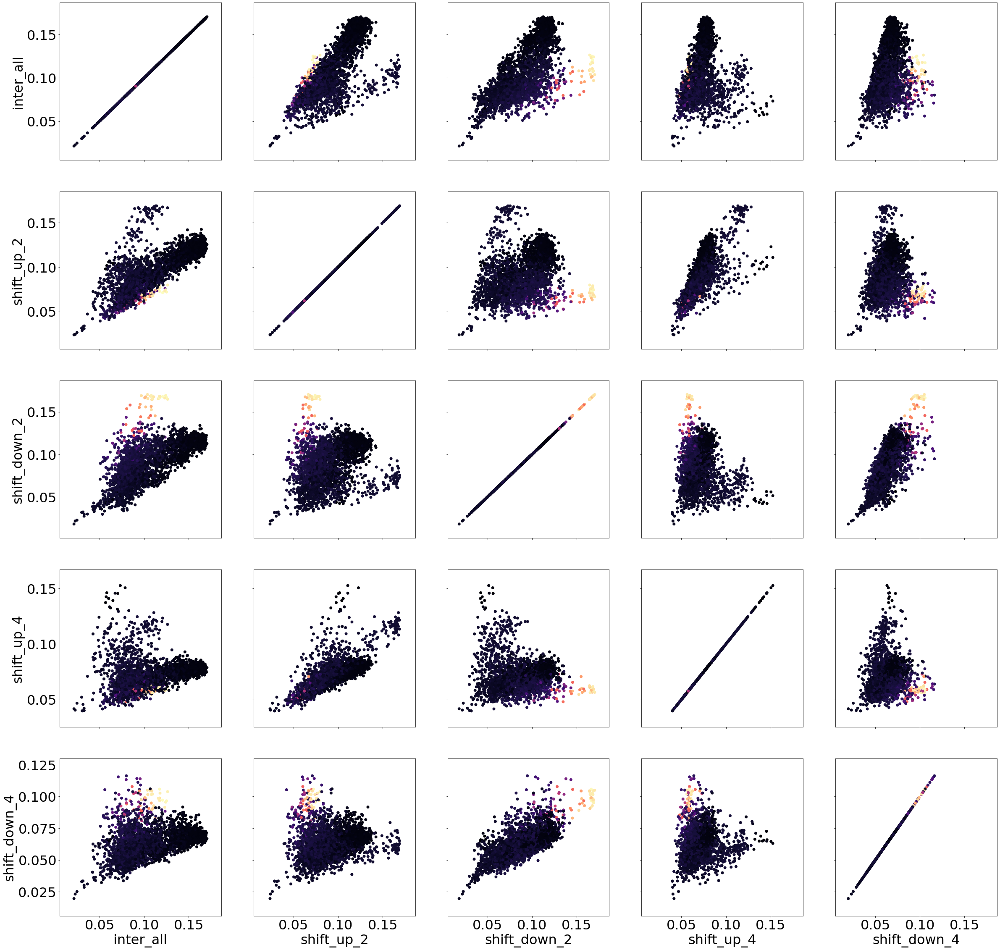

In [54]:
plot_subs(df, bp_match_dict, '5th_EF')

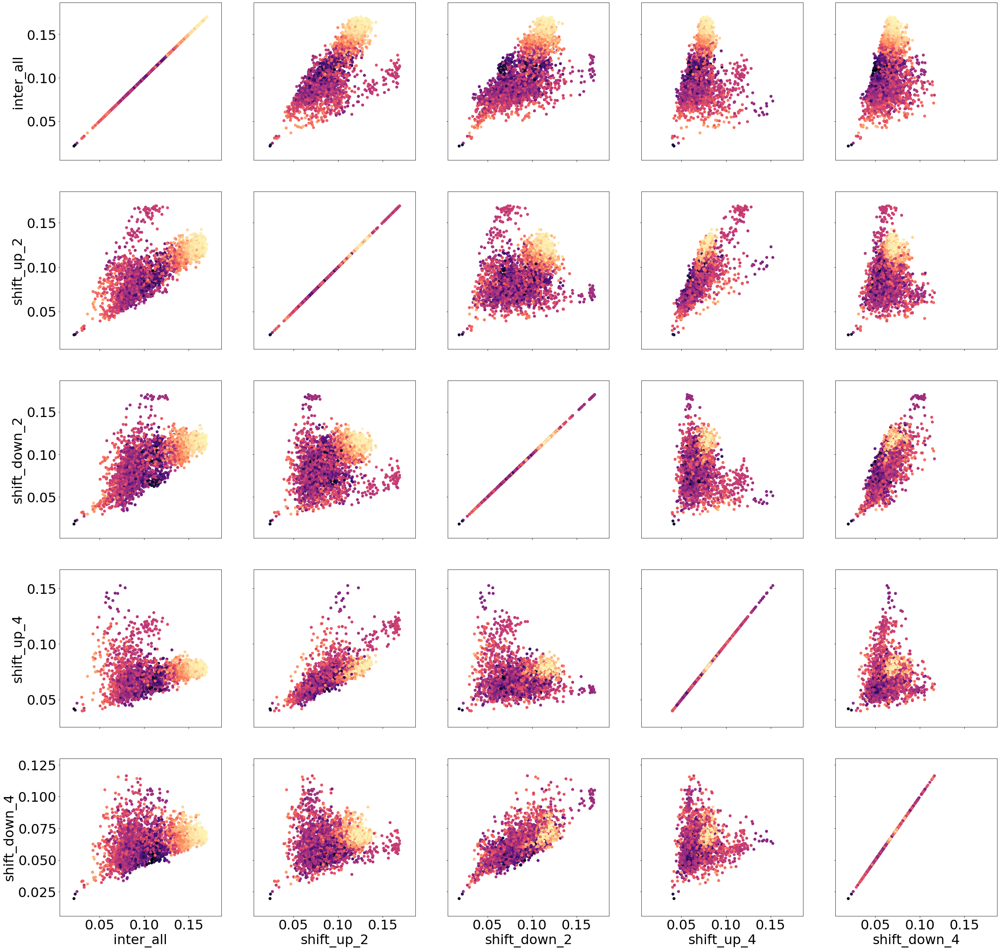

In [57]:
plot_subs(df, bp_match_dict, '7th_EF')

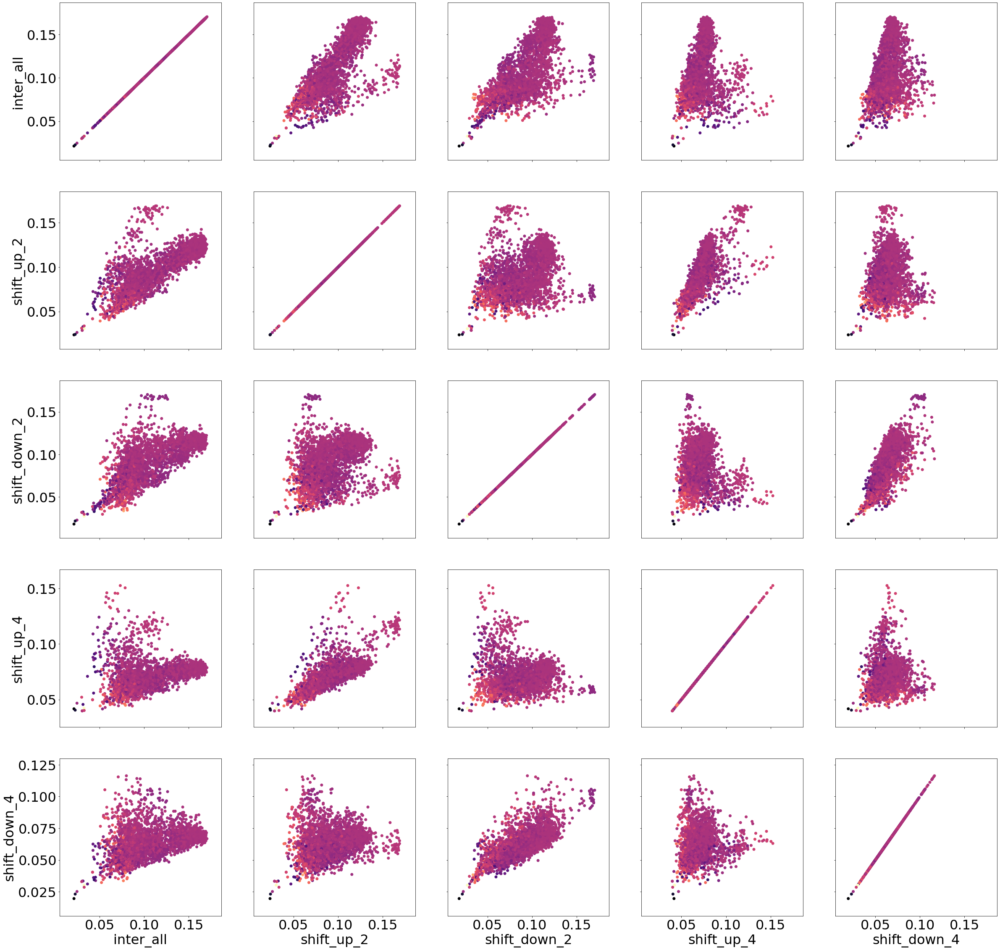

In [58]:
plot_subs(df, bp_match_dict, '8th_EF')

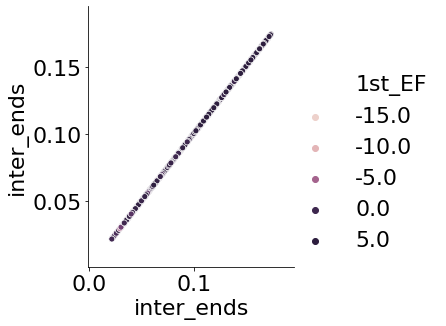

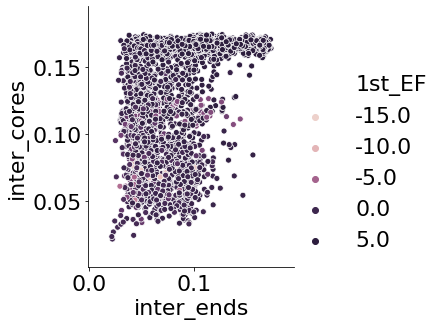

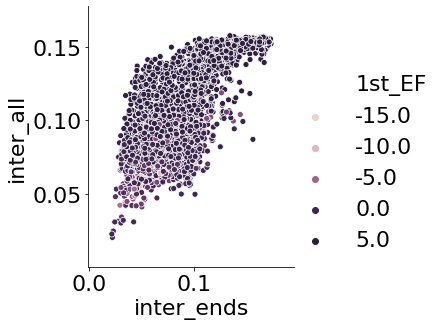

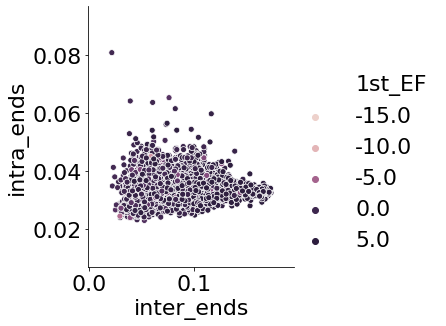

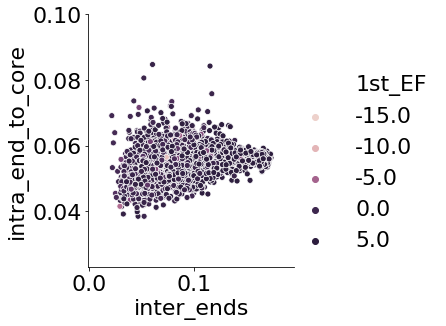

...

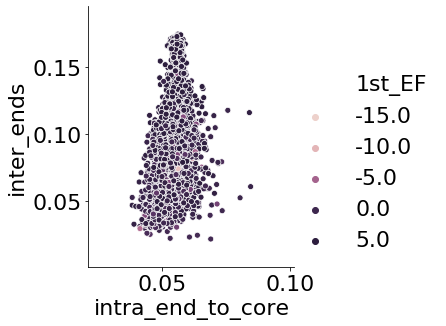

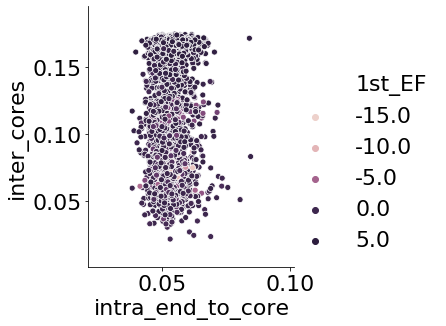

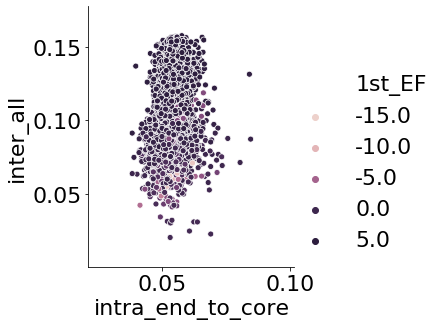

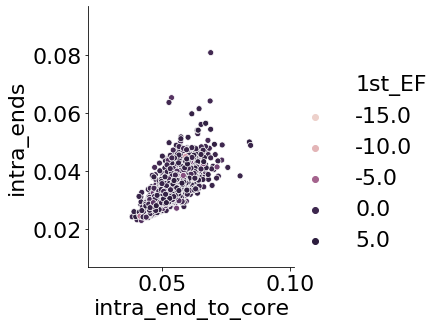

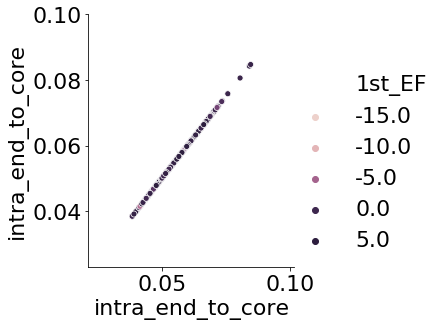

In [18]:
for k_i in bp_match_dict:
    for k_j in bp_match_dict:
        
        sns.relplot(data = df,
                    x = k_i, 
                    y = k_j, 
                    hue = "1st_EF",
                    )